##Importing Libraries

In [ ]:
!pip install rasterio
!pip install opencv-python
!pip install -U tensorflow
!pip install -U keras
!pip install -U opencv-contrib-python
!pip install platipy
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


     
The dataset is stored on the Google Drive of Advith Krishnan


In [ ]:
!pip install stitching

In [ ]:
from PIL import Image
from pathlib import Path
import re
import tensorflow as tf
import cv2
import matplotlib
import os
import rasterio as rio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rasterio.plot import show, show_hist
from sklearn.model_selection import train_test_split
import keras
from rasterio import warp
from rasterio import merge
from rasterio.windows import Window
import stitching
import skimage
import glob
from rasterio.transform import Affine
from rasterio.enums import Resampling
from tensorflow.keras.preprocessing.image import ImageDataGenerator as generate_image

In [ ]:
tifpath = "/content/drive/MyDrive/dataset/images/"
bmppath = "/content/drive/MyDrive/dataset/mask/"
bmpfol = []
tiffol=[]
for image in sorted(os.listdir(tifpath)):
    tiffol.append(tifpath+image)
for _ in sorted(os.listdir(bmppath)):
    bmpfol.append(bmppath+_)

tiffol = sorted(tiffol)
bmpfol = sorted(bmpfol)
print('Instances of Mask Dataset:',len(bmpfol))
print('\nInstances of Raster Image Dataset:',len(tiffol))

Instances of Mask Dataset: 704

Instances of Raster Image Dataset: 352


In [ ]:
plt.style.use('dark_background')

In [ ]:
!pip show rasterio

Name: rasterio
Version: 1.3.8
Summary: Fast and direct raster I/O for use with Numpy and SciPy
Home-page: https://github.com/rasterio/rasterio
Author: Sean Gillies
Author-email: sean@mapbox.com
License: BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: affine, attrs, certifi, click, click-plugins, cligj, numpy, setuptools, snuggs
Required-by: 


In [ ]:
!pip show matplotlib

Name: matplotlib
Version: 3.7.1
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: /usr/local/lib/python3.10/dist-packages
Requires: contourpy, cycler, fonttools, kiwisolver, numpy, packaging, pillow, pyparsing, python-dateutil
Required-by: arviz, datascience, fastai, imgaug, matplotlib-venn, missingno, mizani, mlxtend, music21, platipy, plotnine, prophet, pycocotools, seaborn, wordcloud, yellowbrick


In [ ]:
!pip show numpy

Name: numpy
Version: 1.23.5
Summary: NumPy is the fundamental package for array computing with Python.
Home-page: https://www.numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: albumentations, altair, arviz, astropy, autograd, blis, bokeh, chex, cmdstanpy, contourpy, cufflinks, cvxpy, datascience, db-dtypes, dopamine-rl, ecos, flax, folium, gensim, gym, h5py, holoviews, hyperopt, imageio, imbalanced-learn, imgaug, jax, jaxlib, librosa, lightgbm, matplotlib, matplotlib-venn, missingno, mizani, ml-dtypes, mlxtend, moviepy, music21, nibabel, numba, numexpr, opencv-contrib-python, opencv-python, opencv-python-headless, opt-einsum, optax, orbax-checkpoint, osqp, pandas, pandas-gbq, patsy, plotnine, prophet, pyarrow, pycocotools, pyerfa, pymc, pytensor, python-louvain, PyWavelets, qdldl, qudida, rasterio, rt-utils, scikit-image, scikit-learn, scipy, scs, seaborn, shapely, sklearn-pandas, snuggs, so

In [ ]:
!pip show pandas

Name: pandas
Version: 1.5.3
Summary: Powerful data structures for data analysis, time series, and statistics
Home-page: https://pandas.pydata.org
Author: The Pandas Development Team
Author-email: pandas-dev@python.org
License: BSD-3-Clause
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, python-dateutil, pytz
Required-by: altair, arviz, bokeh, cmdstanpy, cufflinks, datascience, db-dtypes, dopamine-rl, fastai, geopandas, google-colab, gspread-dataframe, holoviews, mizani, mlxtend, pandas-datareader, pandas-gbq, panel, platipy, plotnine, prophet, pymc, seaborn, sklearn-pandas, statsmodels, vega-datasets, xarray, yfinance


In [ ]:
!pip show scikit-learn

Name: scikit-learn
Version: 1.2.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: fastai, imbalanced-learn, librosa, mlxtend, qudida, sklearn-pandas, yellowbrick


In [ ]:
!pip show keras

Name: keras
Version: 2.13.1
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: tensorflow


In [ ]:
!pip show seaborn

Name: seaborn
Version: 0.12.2
Summary: Statistical data visualization
Home-page: 
Author: 
Author-email: Michael Waskom <mwaskom@gmail.com>
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: matplotlib, numpy, pandas
Required-by: missingno


In [ ]:
!pip show opencv-python

Name: opencv-python
Version: 4.8.0.76
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/opencv/opencv-python
Author: 
Author-email: 
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, numpy, numpy, numpy
Required-by: dopamine-rl, imgaug, rt-utils, stitching


In [ ]:
!pip show tensorflow

Name: tensorflow
Version: 2.13.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine-rl


In [ ]:
!pip show scipy

##Exploration

###Time DataFrame

In [ ]:
headers = ["year","day","hour","minute","second","millisecond"]
times = [i.split("/")[6].split("-")[1] for i in tiffol]
timedata = pd.DataFrame(np.array([[i[:4] for i in times],[i[4:7] for i in times],[i[7:9] for i in times],[i[9:11] for i in times],[i[11:13] for i in times],[i[13:] for i in times]]).T,columns = headers[:6]).astype(int)
timedata

,year,day,hour,minute,second,millisecond
0,2017,65,20,36,10,1
1,2017,69,19,15,2,7
2,2017,69,19,15,2,7
3,2017,73,20,51,10,0
4,2017,73,20,51,10,0
...,...,...,...,...,...,...
347,2019,242,22,10,19,2
348,2019,242,22,10,19,2
349,2019,242,22,10,19,2
350,2019,243,23,10,19,2


In [ ]:
timedata.dtypes

year           int64
day            int64
hour           int64
minute         int64
second         int64
millisecond    int64
dtype: object

In [ ]:
timedata[timedata["year"]==2017]

,year,day,hour,minute,second,millisecond
0,2017,65,20,36,10,1
1,2017,69,19,15,2,7
2,2017,69,19,15,2,7
3,2017,73,20,51,10,0
4,2017,73,20,51,10,0
...,...,...,...,...,...,...
119,2017,304,20,15,40,7
120,2017,307,18,45,38,0
121,2017,333,15,15,38,1
122,2017,348,22,15,41,1


In [ ]:
timedata[timedata["year"]==2018]

,year,day,hour,minute,second,millisecond
124,2018,4,17,15,39,5
125,2018,15,21,15,42,6
126,2018,22,22,0,39,9
127,2018,25,20,0,42,1
128,2018,25,20,0,42,1
...,...,...,...,...,...,...
189,2018,276,22,0,37,5
190,2018,280,21,15,37,7
191,2018,288,23,45,38,0
192,2018,312,20,0,35,8


In [ ]:
timedata[timedata["year"]==2019]

,year,day,hour,minute,second,millisecond
194,2019,11,19,0,35,2
195,2019,21,19,0,34,4
196,2019,48,18,15,30,9
197,2019,64,21,0,30,6
198,2019,64,21,0,30,6
...,...,...,...,...,...,...
347,2019,242,22,10,19,2
348,2019,242,22,10,19,2
349,2019,242,22,10,19,2
350,2019,243,23,10,19,2


In [ ]:
timedata[timedata["year"]==2017].shape

(124, 6)

In [ ]:
timedata[timedata["year"]==2018].shape

(70, 6)

In [ ]:
timedata[timedata["year"]==2019].shape

(158, 6)

###Reprojection (GeoTIFF)

In [ ]:
wgstifpath="/content/drive/MyDrive/wgs84/images/"
wgsmaskpath="/content/drive/MyDrive/dataset/mask/"

In [ ]:
len(os.listdir(wgstifpath))

352

In [ ]:
len(os.listdir(wgsmaskpath))

704

In [ ]:
dst_crs = 'EPSG:4326'
for i in os.listdir(wgstifpath):
  with rio.open(tifpath+i) as src:
      transform, width, height = warp.calculate_default_transform(
          src.crs, dst_crs, src.width, src.height, *src.bounds)
      kwargs = src.meta.copy()
      kwargs.update({
          'crs': dst_crs,
          'transform': transform,
          'width': width,
          'height': height
      })

      with rio.open(wgstifpath+i, 'w', **kwargs) as dst:
          for j in range(1, src.count + 1):
              warp.reproject(
                  source=rio.band(src, j),
                  destination=rio.band(dst, j),
                  src_transform=src.transform,
                  src_crs=src.crs,
                  dst_transform=transform,
                  dst_crs=dst_crs,
                  resampling=warp.Resampling.nearest)

In [ ]:
wgstiffol = [wgstifpath+i for i in os.listdir(wgstifpath)]

###Bounds and Transforms DataFrame (GeoTIFF)


In [ ]:
rastcols = ['Height','Width','Bounds','Affine']
bounddata = pd.DataFrame(columns = rastcols)
for i in sorted(wgstiffol):
    img = rio.open(i)
    bounddata.loc[len(bounddata.index)]=[img.meta['height'],img.meta['width'],img.bounds, img.transform]
bounddata

,Height,Width,Bounds,Affine
0,354,395,"(-102.0, 35.20033123377855, -97.20234699814273...","(0.012145956966727265, 0.0, -102.0, 0.0, -0.01..."
1,51,51,"(-86.6, 30.101836973312473, -86.00183697331246...","(0.01172868679779467, 0.0, -86.6, 0.0, -0.0117..."
2,40,56,"(-96.7, 36.30437599581237, -96.00612639413733,...","(0.012390600104690659, 0.0, -96.7, 0.0, -0.012..."
3,218,183,"(-95.5, 29.4029720065646, -93.40387099633634, ...","(0.0114542568506211, 0.0, -95.5, 0.0, -0.01145..."
4,78,87,"(-98.6, 26.700591540907375, -97.5968136417813,...","(0.011530877680674697, 0.0, -98.6, 0.0, -0.011..."
...,...,...,...,...
347,102,78,"(-119.2, 37.597696425898384, -118.280591384510...","(0.0117872899421727, 0.0, -119.2, 0.0, -0.0117..."
348,150,137,"(-83.7, 31.99976348894281, -82.10145065323444,...","(0.011668243407047925, 0.0, -83.7, 0.0, -0.011..."
349,368,259,"(-89.48, 29.36936711397628, -86.53765239815179...","(0.0113604154511514, 0.0, -89.48, 0.0, -0.0113..."
350,103,180,"(-119.28, 35.89575490287006, -117.000736723462...","(0.012662573758543126, 0.0, -119.28, 0.0, -0.0..."


###Mosaic analysis (GeoTIFF)

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol[0:124]],resampling = 3,method='max')

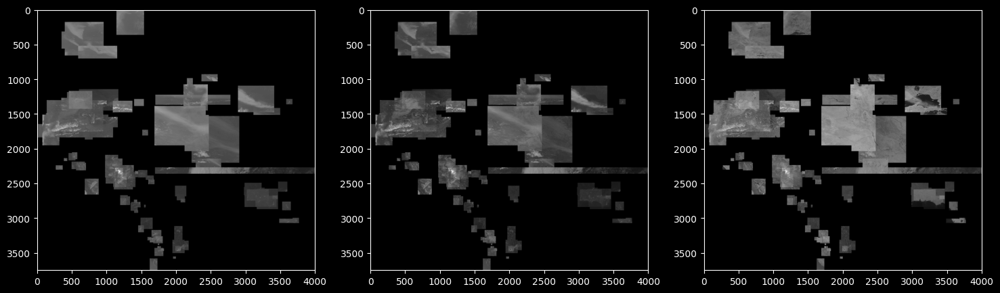

In [ ]:
fig,ax = plt.subplots(1,3,figsize=(18,22))
ax[0].imshow(mosaic[0],cmap="gray")
ax[1].imshow(mosaic[1],cmap="gray")
ax[2].imshow(mosaic[2],cmap="gray")
ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,4000)
ax[2].set_xlim(0,4000)
plt.show()

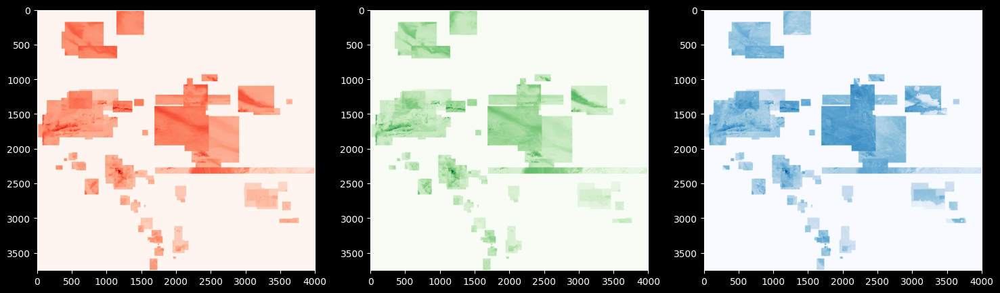

In [ ]:
fig,ax = plt.subplots(1,3,figsize=(18,22))
ax[0].imshow(mosaic[0],cmap="Reds")
ax[1].imshow(mosaic[1],cmap="Greens")
ax[2].imshow(mosaic[2],cmap="Blues")
ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,4000)
ax[2].set_xlim(0,4000)
plt.show()

In [ ]:
rgb = np.dstack((mosaic[0],mosaic[1],mosaic[2]))

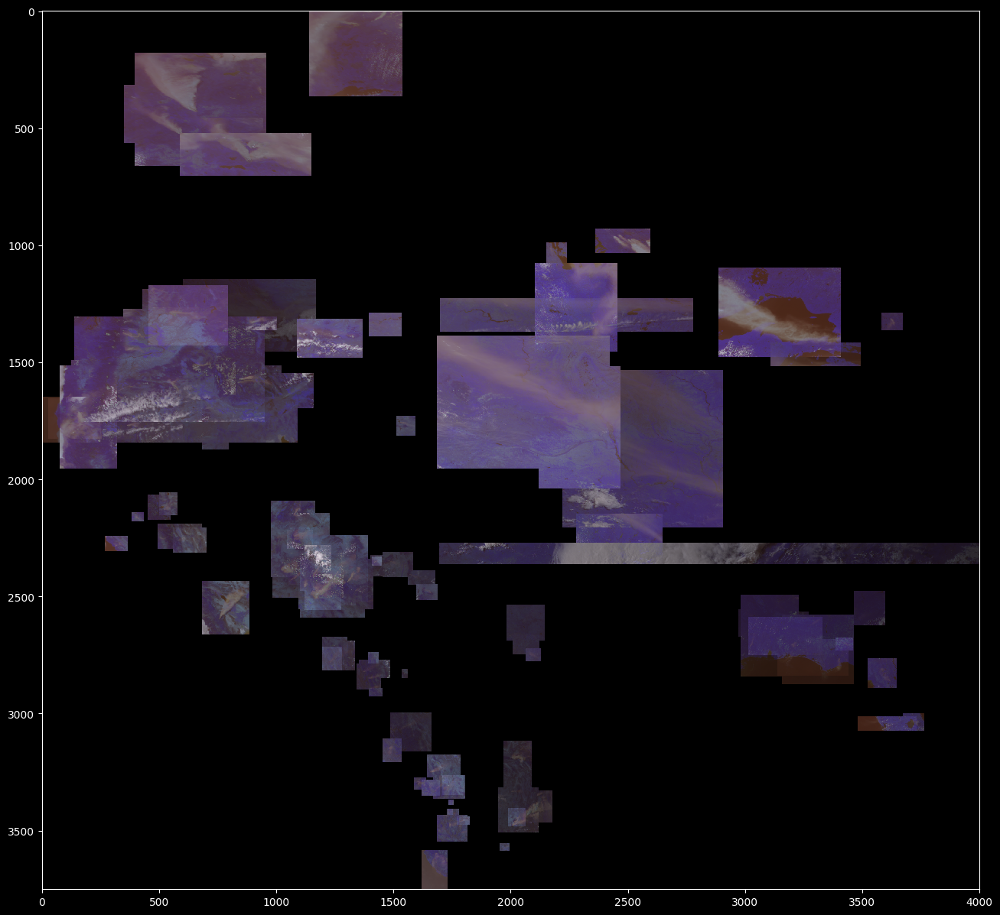

In [ ]:
plt.figure(figsize=(13,18))
skimage.io.imshow(rgb)
plt.xlim(0,4000)
plt.show()

In [ ]:
infra = np.dstack((mosaic[3],mosaic[4],mosaic[5]))

(0.0, 4000.0)

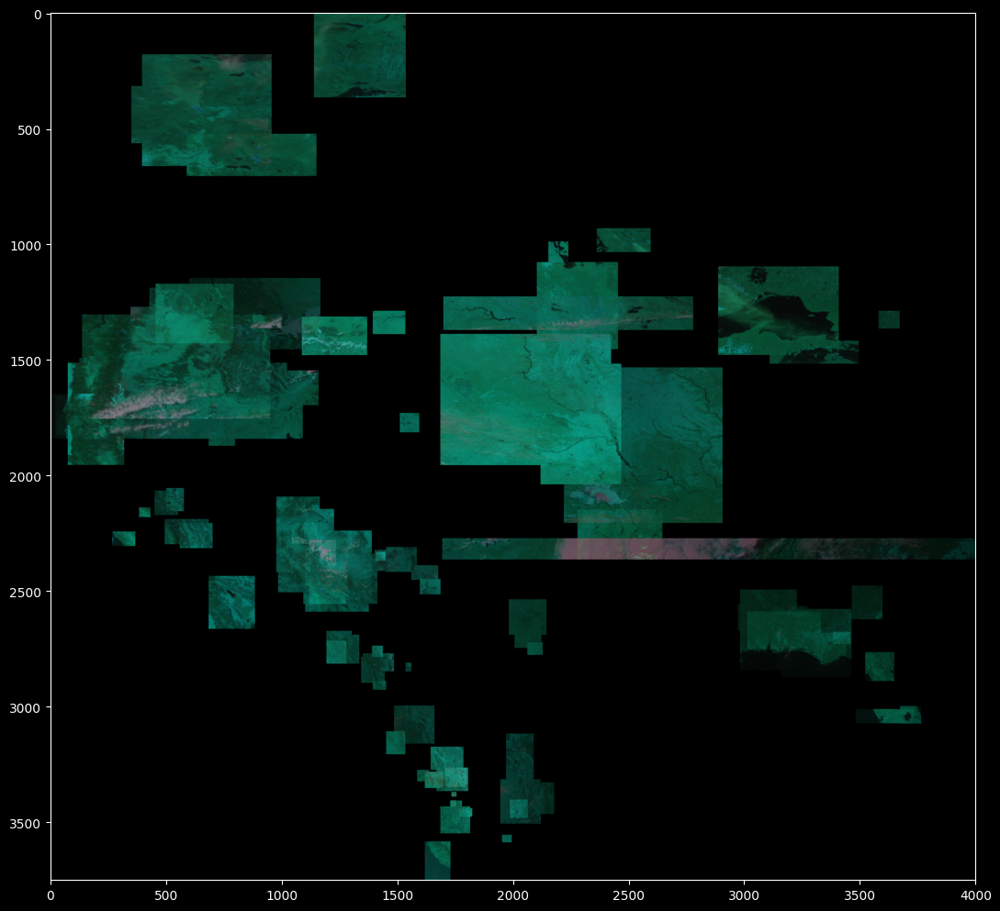

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(infra,cmap='gray')
plt.xlim(0,4000)

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol[124:193]],resampling = 3,method='max')

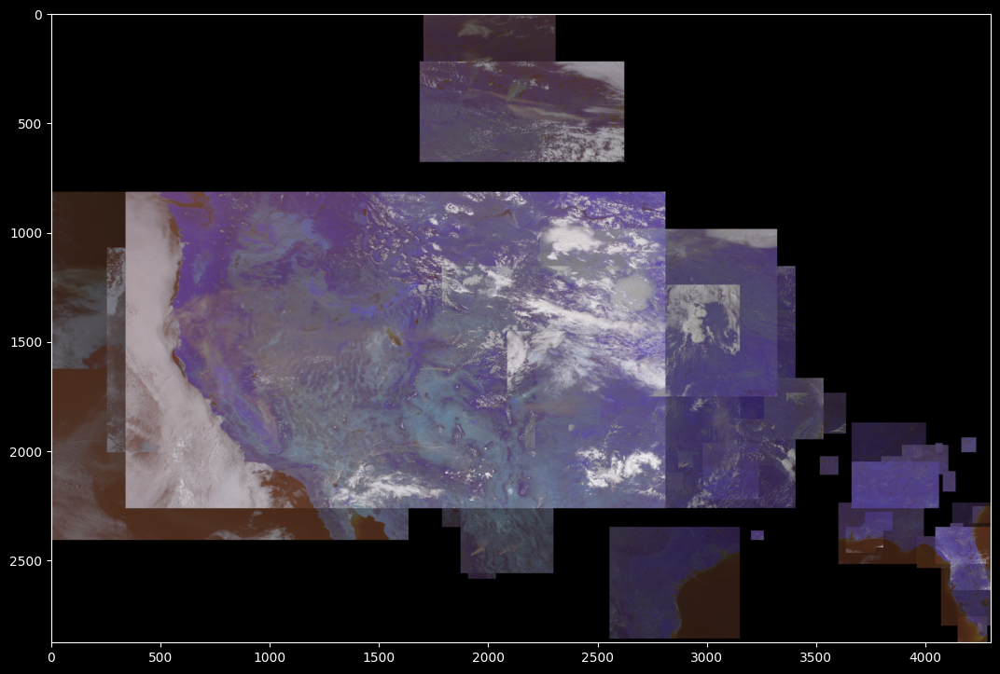

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
plt.xlim(0,4300)
plt.show()

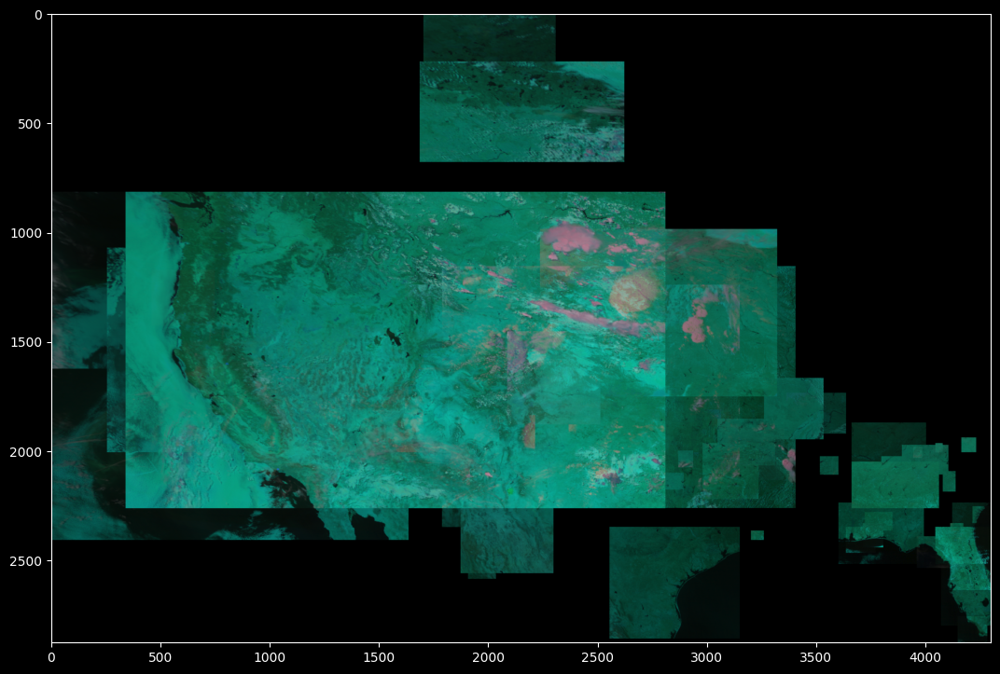

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
plt.xlim(0,4300)
plt.show()

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol[193:352]],resampling = 3,method='max')

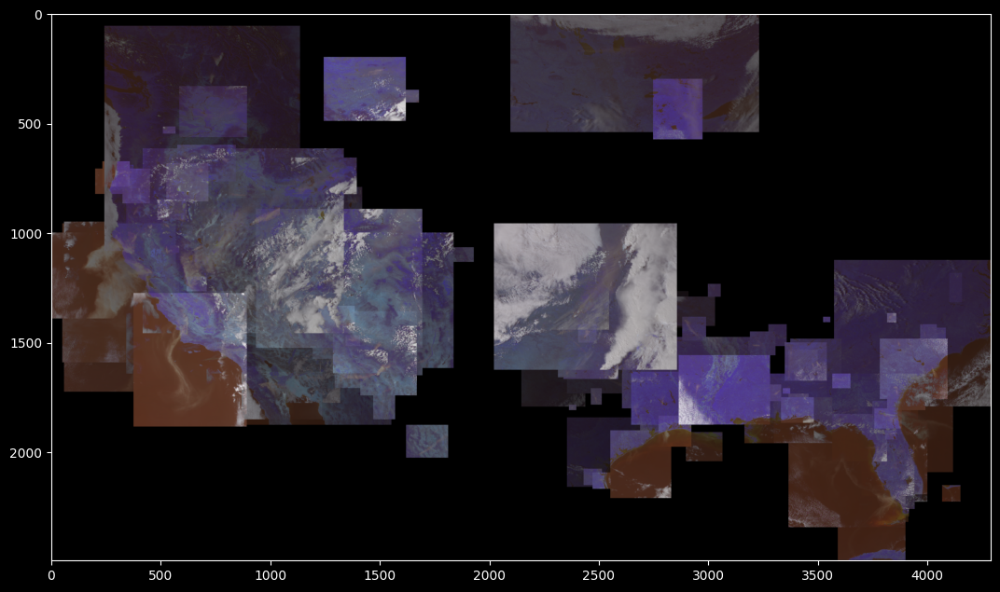

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
plt.show()

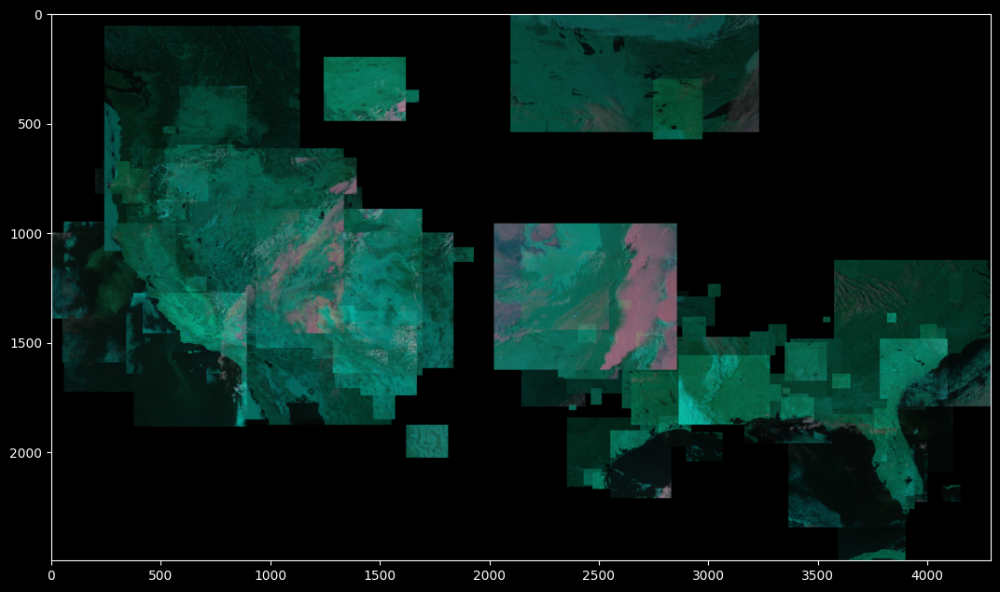

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
plt.show()

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol],resampling = 3,method='max')

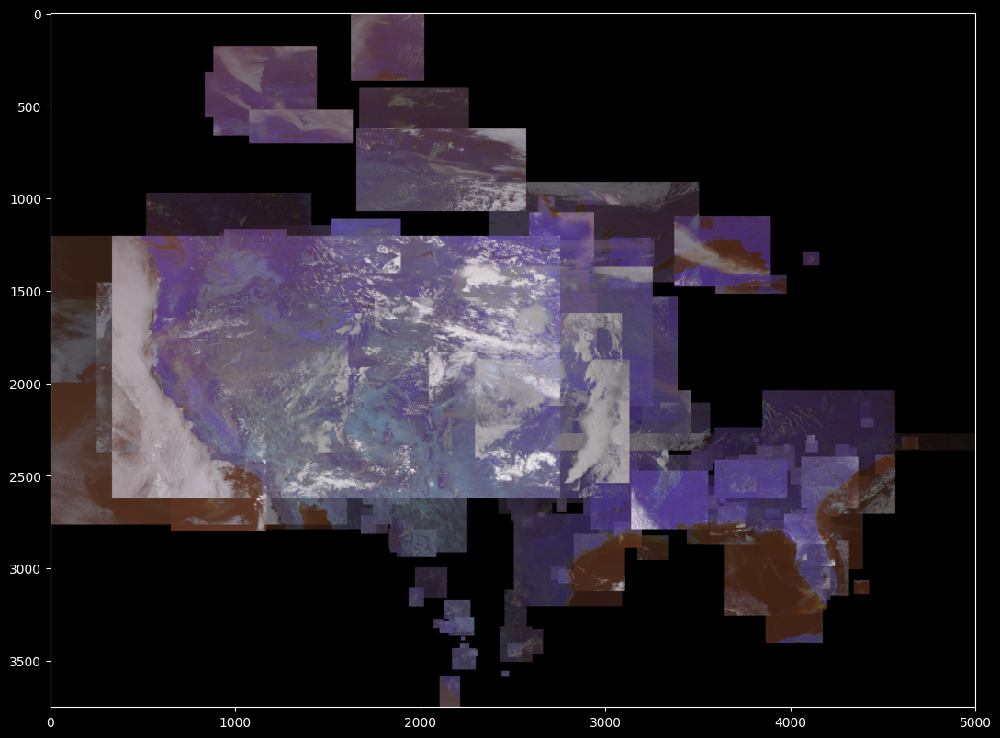

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
plt.xlim(0,5000)
plt.show()

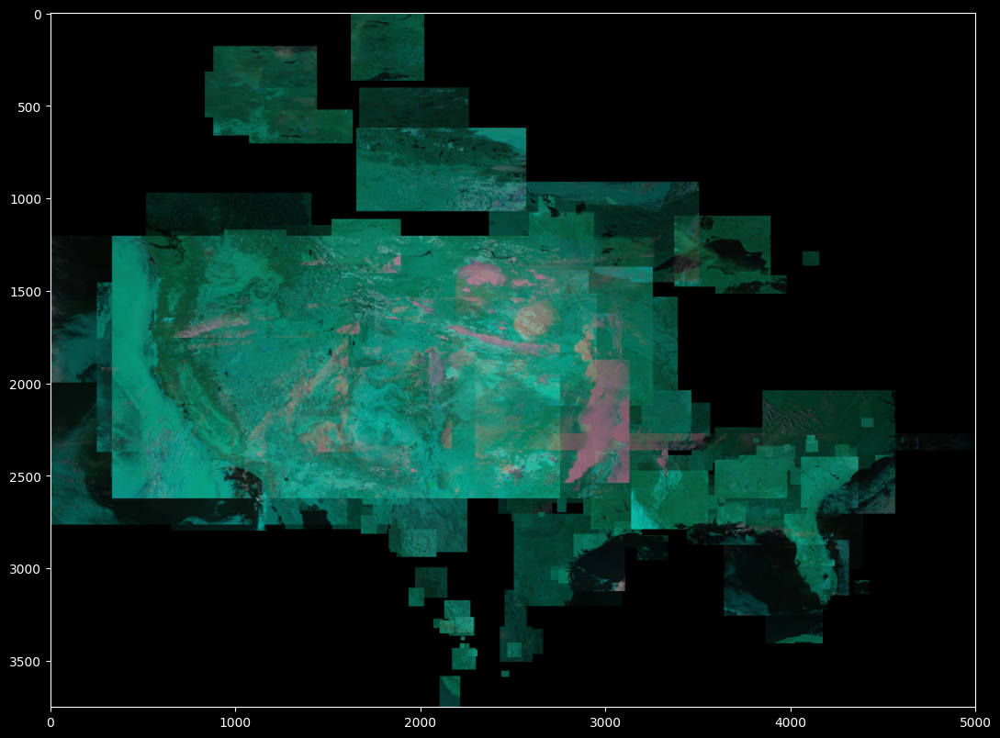

In [ ]:
plt.figure(figsize=(13,18))
plt.imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
plt.xlim(0,5000)
plt.show()

###Reprojection (Masks)

In [ ]:
wgsbmppath="/content/drive/MyDrive/wgs84/mask/"

In [ ]:
def georeference_bitmap_mask(bitmap_mask, reference_raster):
  dst_crs = "EPSG:4326"
  with rio.open(reference_raster) as ref:
        trans, wid, hei = warp.calculate_default_transform(ref.crs, dst_crs, ref.width, ref.height, *ref.bounds)
        kwargs = ref.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': trans,
            'width': wid,
            'height': hei
        })
        with rio.open(bitmap_mask,'r+',**kwargs) as bmp:
          for i in range(1,bmp.count+1):
            warp.reproject(
                    source=rio.band(bmp, i),
                    destination=rio.band(bmp, i),
                    src_transform=trans,
                    src_crs=dst_crs,
                    resampling=warp.Resampling.nearest)

In [ ]:
!rio --help

Usage: rio [OPTIONS] COMMAND [ARGS]...

  Rasterio command line interface.

Options:
  -v, --verbose           Increase verbosity.
  -q, --quiet             Decrease verbosity.
  --aws-profile TEXT      Select a profile from
                          the AWS credentials file
  --aws-no-sign-requests  Make requests
                          anonymously
  --aws-requester-pays    Requester pays data
                          transfer costs
  --version               Show the version and
                          exit.
  --gdal-version
  --show-versions         Show dependency versions
  --help                  Show this message and
                          exit.

Commands:
  blocks     Write dataset blocks as GeoJSON...
  bounds     Write bounding boxes to stdout as
             GeoJSON.
  calc       Raster data calculator.
  clip       Clip a raster to given bounds.
  convert    Copy and convert raster dataset.
  edit-info  Edit dataset metadata.
  env        Print information about the 

In [ ]:
def afftransform(srcpath,dstpath):
  with rio.open(srcpath,'r') as src:
      transform, width, height = warp.calculate_default_transform(
          src.crs, dst_crs, src.width, src.height, *src.bounds)
      kwargs = src.meta.copy()
      kwargs.update({
          'crs': dst_crs,
          'transform': transform,
          'width': width,
          'height': height
      })

      with rio.open(dstpath, 'r+', **kwargs) as dst:
          for j in range(1, src.count + 1):
              warp.reproject(
                  source=rio.band(src, j),
                  destination=rio.band(dst, j),
                  dst_transform=transform,
                  dst_crs=dst_crs,
                  resampling=warp.Resampling.nearest)


In [ ]:
dir_path = Path(wgsmaskpath)
for ffile in dir_path.glob("*.bmp"):
    img = Image.open(ffile).convert('RGB')
    newimg = ffile.replace(ffile.with_suffix(".tif"))
    img.save(newimg, format='TIFF', compression='tiff_lzw')

In [ ]:
for item in os.listdir(wgsmaskpath):
    if item.endswith(".aux.xml"):
        os.remove( os.path.join( wgsmaskpath, item ) )

In [ ]:
for i in sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp")):
    afftransform(i,i)

In [ ]:
for i,j in zip(sorted(os.listdir("/content/drive/MyDrive/dataset/images/")),sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))):
  afftransform(j,"/content/drive/MyDrive/dataset/images/"+i)
  afftransform(j,j)

In [ ]:
samp = rio.open("/content/drive/MyDrive/dataset/images/" + sorted(os.listdir(wgstifpath))[0])
samp, samp.meta

(<open DatasetReader name='/content/drive/MyDrive/dataset/images/time-20170652036101-loc--102.0_35.2_-97.2_39.5.tif' mode='r'>,
 {'driver': 'GTiff',
  'dtype': 'uint8',
  'nodata': 0.0,
  'width': 395,
  'height': 354,
  'count': 6,
  'crs': CRS.from_epsg(4326),
  'transform': Affine(0.012145956966727265, 0.0, -102.0,
         0.0, -0.012145956966727265, 39.5)})

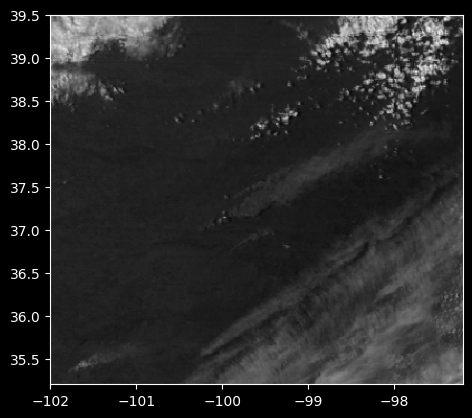

<Axes: >

In [ ]:
show(samp,cmap='gray',transform = samp.transform)

In [ ]:
samp = rio.open(sorted(glob.glob("/content/drive/MyDrive/wgs84/mask/*"))[0])
samp, samp.meta

/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


(<open DatasetReader name='/content/drive/MyDrive/wgs84/mask/time-20170652036101-loc--102.0_35.2_-97.2_39.5.tif' mode='r'>,
 {'driver': 'GTiff',
  'dtype': 'uint8',
  'nodata': None,
  'width': 352,
  'height': 397,
  'count': 3,
  'crs': None,
  'transform': Affine(1.0, 0.0, 0.0,
         0.0, 1.0, 0.0)})

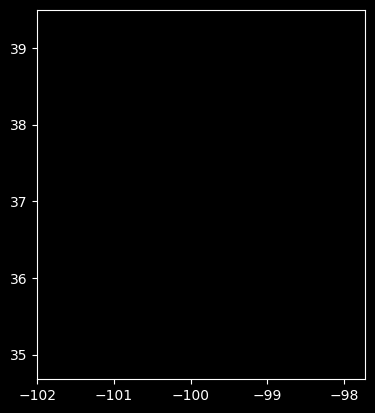

<Axes: >

In [ ]:
show(samp,cmap='gray',transform = samp.transform)

In [ ]:
np.unique(samp.read())

array([  0, 255], dtype=uint8)

###Mosaic Analysis (Masks)

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol],resampling = 3,method='max')

In [ ]:
maskmosaic,maskout_trans = merge.merge([rio.open(i) for i in sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))],resampling = 3,method='max')

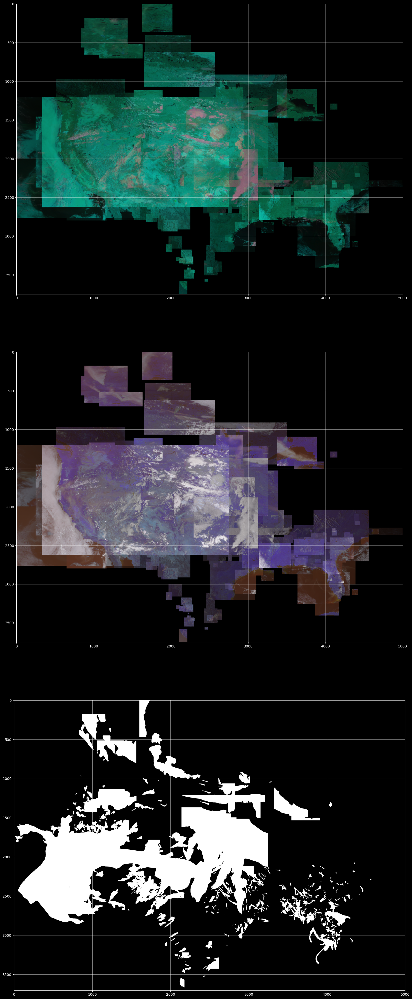

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(50,50))
ax[0].imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
ax[1].imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
ax[2].imshow(maskmosaic[0],cmap="gray")
for i in range(0,3):
  ax[i].set_xlim(0,5000)
  ax[i].grid(axis='both', linestyle='-',alpha=0.5)
plt.show()

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol],resampling = 3,method='last')

In [ ]:
maskmosaic,maskout_trans = merge.merge([rio.open(i) for i in sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))],resampling = 3,method='last')

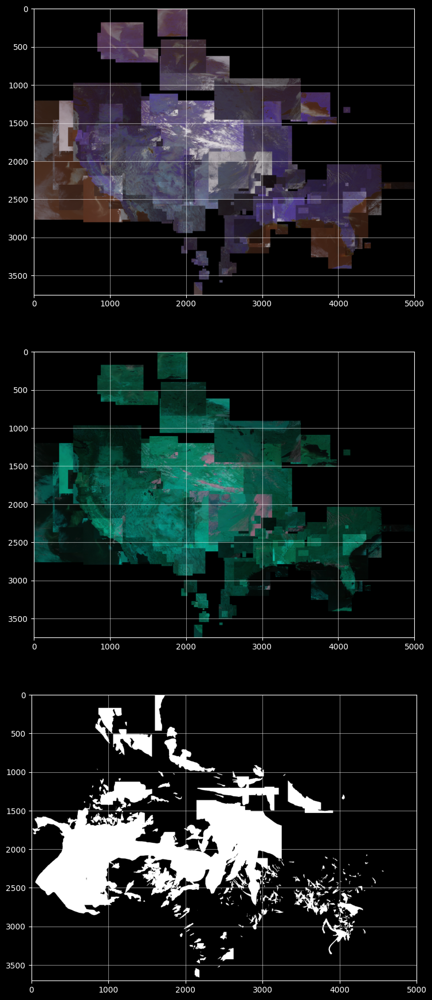

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(22,22))
ax[0].imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
ax[1].imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
ax[2].imshow(maskmosaic[0],cmap="gray")
for i in range(0,3):
  ax[i].set_xlim(0,5000)
  ax[i].grid(axis='both', linestyle='-',alpha=0.5)
plt.show()

In [ ]:
mosaic,out_trans = merge.merge([rio.open(i) for i in wgstiffol],resampling = 3,method='first')

In [ ]:
maskmosaic,maskout_trans = merge.merge([rio.open(i) for i in sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))],resampling = 3,method='first')

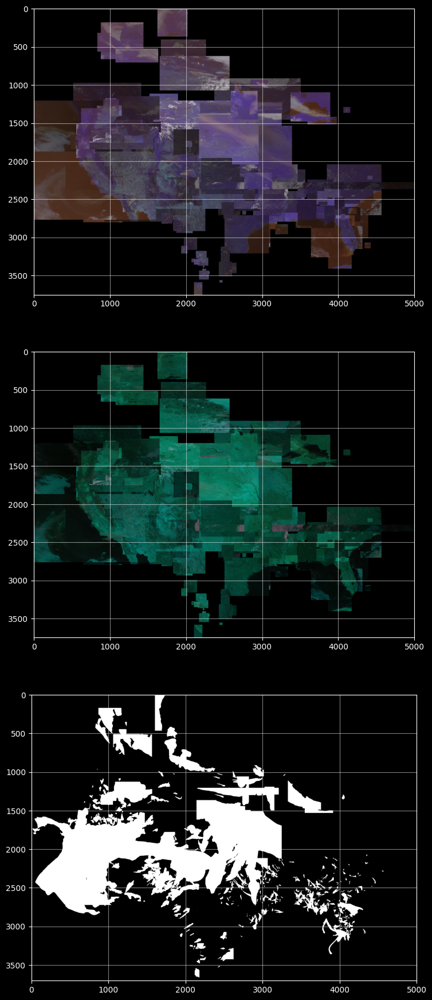

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(22,22))
ax[0].imshow(np.dstack((mosaic[0],mosaic[1],mosaic[2])),cmap="gray")
ax[1].imshow(np.dstack((mosaic[3],mosaic[4],mosaic[5])),cmap="gray")
ax[2].imshow(maskmosaic[0],cmap="gray")
for i in range(0,3):
  ax[i].set_xlim(0,5000)
  ax[i].grid(axis='both', linestyle='-',alpha=0.5)
plt.show()

###Bounds and Tranform DataFrame (Masks)

In [ ]:
rastcols = ['Height','Width','Bounds','Affine']
boundmaskdata = pd.DataFrame(columns = rastcols)
wgsbmpfol = sorted([i for i in sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))])
for i in wgsbmpfol:
    img = rio.open(i)
    boundmaskdata.loc[len(boundmaskdata.index)]=[img.meta['height'],img.meta['width'],img.bounds, img.transform]
boundmaskdata

,Height,Width,Bounds,Affine
0,397,352,"(-102.0, 34.67805508420928, -97.72462314771201...","(0.012145956966727265, 0.0, -102.0, 0.0, -0.01..."
1,55,47,"(-86.6, 30.054922226121292, -86.04875172050365...","(0.01172868679779467, 0.0, -86.6, 0.0, -0.0117..."
2,46,52,"(-96.7, 36.230032395184224, -96.05568879455609...","(0.012390600104690659, 0.0, -96.7, 0.0, -0.012..."
3,231,167,"(-95.5, 29.254066667506525, -93.58713910594628...","(0.0114542568506211, 0.0, -95.5, 0.0, -0.01145..."
4,83,82,"(-98.6, 26.642937152504, -97.65446803018467, 2...","(0.011530877680674697, 0.0, -98.6, 0.0, -0.011..."
...,...,...,...,...
347,110,66,"(-119.2, 37.503398106361, -118.42203886381661,...","(0.0117872899421727, 0.0, -119.2, 0.0, -0.0117..."
348,161,124,"(-83.7, 31.871412811465284, -82.25313781752607...","(0.011668243407047925, 0.0, -83.7, 0.0, -0.011..."
349,386,231,"(-89.48, 29.164879635855556, -86.8557440307840...","(0.0113604154511514, 0.0, -89.48, 0.0, -0.0113..."
350,120,169,"(-119.28, 35.68049114897483, -117.140025034806...","(0.012662573758543126, 0.0, -119.28, 0.0, -0.0..."


In [ ]:
bounddata

,Height,Width,Bounds,Affine
0,354,395,"(-102.0, 35.20033123377855, -97.20234699814273...","(0.012145956966727265, 0.0, -102.0, 0.0, -0.01..."
1,51,51,"(-86.6, 30.101836973312473, -86.00183697331246...","(0.01172868679779467, 0.0, -86.6, 0.0, -0.0117..."
2,40,56,"(-96.7, 36.30437599581237, -96.00612639413733,...","(0.012390600104690659, 0.0, -96.7, 0.0, -0.012..."
3,218,183,"(-95.5, 29.4029720065646, -93.40387099633634, ...","(0.0114542568506211, 0.0, -95.5, 0.0, -0.01145..."
4,78,87,"(-98.6, 26.700591540907375, -97.5968136417813,...","(0.011530877680674697, 0.0, -98.6, 0.0, -0.011..."
...,...,...,...,...
347,102,78,"(-119.2, 37.597696425898384, -118.280591384510...","(0.0117872899421727, 0.0, -119.2, 0.0, -0.0117..."
348,150,137,"(-83.7, 31.99976348894281, -82.10145065323444,...","(0.011668243407047925, 0.0, -83.7, 0.0, -0.011..."
349,368,259,"(-89.48, 29.36936711397628, -86.53765239815179...","(0.0113604154511514, 0.0, -89.48, 0.0, -0.0113..."
350,103,180,"(-119.28, 35.89575490287006, -117.000736723462...","(0.012662573758543126, 0.0, -119.28, 0.0, -0.0..."


In [ ]:
boundmaskdata['Bounds'].equals(bounddata['Bounds']),boundmaskdata['Affine'].equals(bounddata['Affine'])

(False, False)

###Mosaicking

In [ ]:
rasmospath = "/content/drive/MyDrive/Mosaics/Rasters/"
maskmospath =  "/content/drive/MyDrive/Mosaics/Masks/"

rastilpath = "/content/drive/MyDrive/Tiles/Rasters/"
masktilpath =  "/content/drive/MyDrive/Tiles/Masks/"

In [ ]:
lessthan256 = []
for i in sorted(os.listdir(wgstifpath)):
  img = rio.open(wgstifpath+i)
  if img.shape[0]<=400 and img.shape[1]<=400:
    lessthan256.append(sorted(os.listdir(wgstifpath)).index(i))

In [ ]:
len(lessthan256)

301

In [ ]:
mosaic, out_trans = merge.merge([rio.open(wgstifpath+sorted(os.listdir(wgstifpath))[i]) for i in lessthan256])

In [ ]:
rgb = np.dstack((mosaic[0],mosaic[1],mosaic[2]))

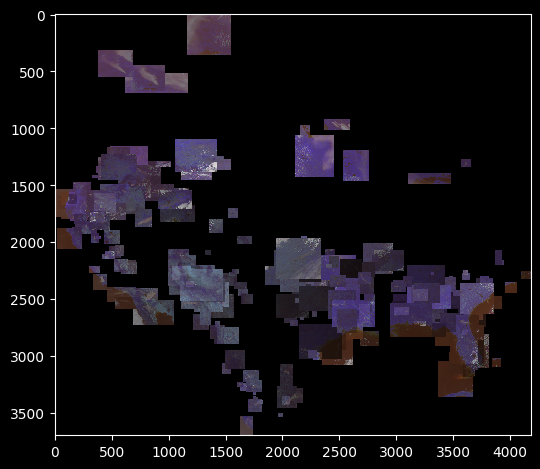

In [ ]:
#plt.figure(figsize=(13,18))
skimage.io.imshow(rgb)
plt.show()

In [ ]:
wgsbmppath="/content/drive/MyDrive/wgs84/mask"

In [ ]:
maskmosaic, out_trans = merge.merge([rio.open(sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))[i]) for i in lessthan256],resampling = 3,method='max')

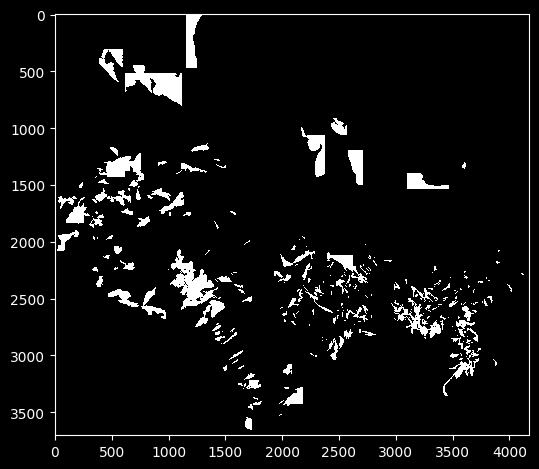

In [ ]:
skimage.io.imshow(maskmosaic[0])
plt.show()

In [ ]:
morethan256 = []
for i in sorted(os.listdir(wgstifpath)):
  img = rio.open(wgstifpath+i)
  if img.shape[0]>=400 and img.shape[1]>=400:
    morethan256.append(sorted(os.listdir(wgstifpath)).index(i))

In [ ]:
mosaic, out_trans = merge.merge([rio.open(wgstifpath+sorted(os.listdir(wgstifpath))[i]) for i in morethan256[:len(morethan256)//2]],resampling = 3,method='first')

In [ ]:
rgb = np.dstack((mosaic[0],mosaic[1],mosaic[2]))

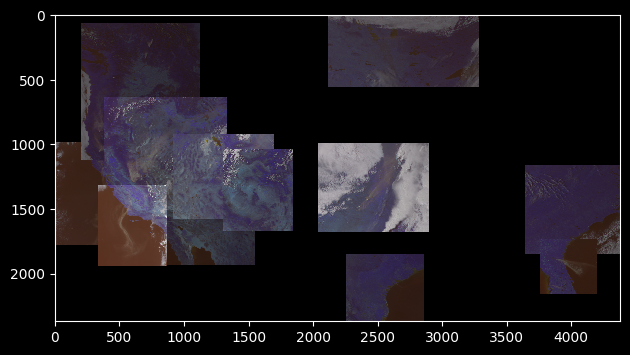

In [ ]:
#plt.figure(figsize=(13,18))
skimage.io.imshow(rgb)
plt.show()

In [ ]:
wgsbmppath="/content/drive/MyDrive/wgs84/mask"

In [ ]:
maskmosaic, out_trans = merge.merge([rio.open(sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))[i]) for i in morethan256[:len(morethan256)//2]],resampling = 3,method='first')

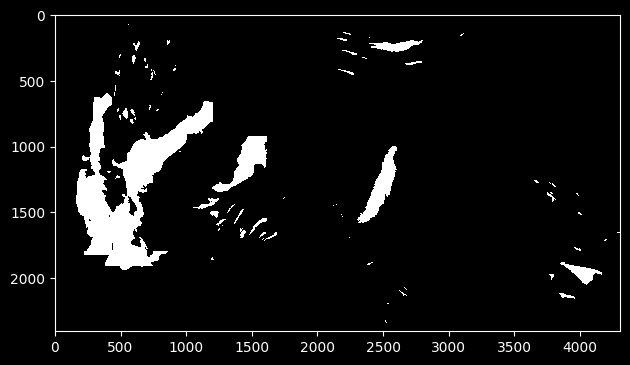

In [ ]:
skimage.io.imshow(maskmosaic[0])
plt.show()

In [ ]:
mosaic, out_trans = merge.merge([rio.open(wgstifpath+sorted(os.listdir(wgstifpath))[i]) for i in morethan256[len(morethan256)//2:len(morethan256)*6//9]],resampling = 3,method='first')

In [ ]:
rgb = np.dstack((mosaic[0],mosaic[1],mosaic[2]))

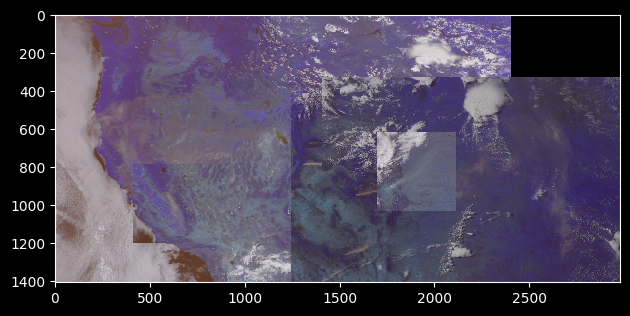

In [ ]:
#plt.figure(figsize=(13,18))
skimage.io.imshow(rgb)
plt.show()

In [ ]:
wgsbmppath="/content/drive/MyDrive/wgs84/mask"

In [ ]:
maskmosaic, out_trans = merge.merge([rio.open(sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))[i]) for i in morethan256[len(morethan256)//2:len(morethan256)*6//9]],resampling = 3,method='first')

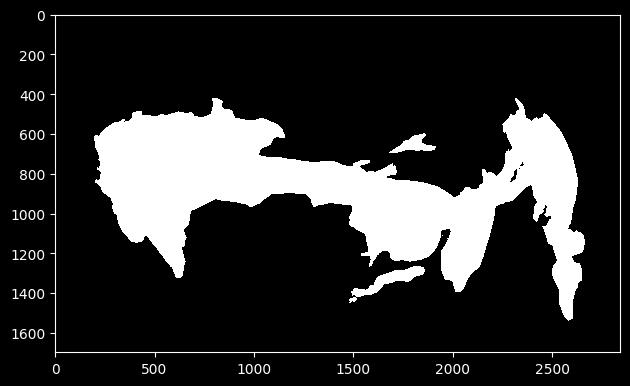

In [ ]:
skimage.io.imshow(maskmosaic[0])
plt.show()

In [ ]:
mosaic, out_trans = merge.merge([rio.open(wgstifpath+sorted(os.listdir(wgstifpath))[i]) for i in morethan256[len(morethan256)*6//9:len(morethan256)*8//10]],resampling = 3,method='last')

In [ ]:
rgb = np.dstack((mosaic[0],mosaic[1],mosaic[2]))

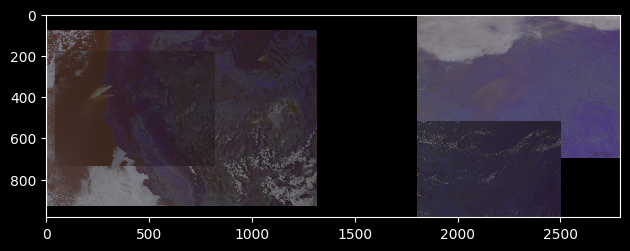

In [ ]:
#plt.figure(figsize=(13,18))
skimage.io.imshow(rgb)
plt.show()

In [ ]:
wgsbmppath="/content/drive/MyDrive/wgs84/mask"

In [ ]:
maskmosaic, out_trans = merge.merge([rio.open(sorted(glob.glob("/content/drive/MyDrive/dataset/mask/*.bmp"))[i]) for i in morethan256[len(morethan256)*6//9:len(morethan256)*8//10]],resampling = 3,method='first')

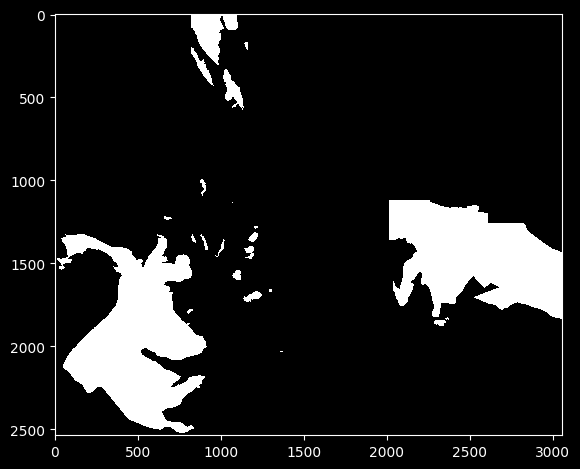

In [ ]:
skimage.io.imshow(maskmosaic[0])
plt.show()

###Tiling

In [ ]:
mosaiccount = 3
with rio.open(rasmospath+str(mosaiccount),"w", driver ='Gtiff',count=6,
          height= mosaic.shape[1],
          width = mosaic.shape[2],
          transform= out_trans,
          crs= "EPSG:4326",
          dtype = "uint8") as dest:
  dest.write(mosaic)

In [ ]:
mosaiccount = 3
with rio.open(maskmospath+str(mosaiccount),"w", driver ='Gtiff',count=1,
          height= maskmosaic.shape[1],
          width = maskmosaic.shape[2],
          transform= out_trans,
          crs= "EPSG:4326",
          dtype = "uint8") as dest:
  dest.write(maskmosaic)

In [ ]:
tilecount=0

In [ ]:
def augmentrot(array,angle):
  image_array = np.array(array)
  center = (image_array.shape[1]//2,image_array.shape[0]//2)
  rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
  rotated_image = cv2.warpAffine(image_array, rotation_matrix, (image_array.shape[1],image_array.shape[0]))
  return rotated_image

In [ ]:
for mosaic,masmos in zip(os.listdir(rasmospath),os.listdir(maskmospath)):
  mosaic = rio.open(rasmospath + mosaic)
  masmos = rio.open(maskmospath + masmos)
  for i in range(0,mosaic.height,200):
    for j in range(0,mosaic.width,200):
      window = rio.windows.Window(j, i, 256, 256)
      array = mosaic.read(window=window)
      num_zeros = np.count_nonzero(array==0)
      maskarr = masmos.read(window=window)
      mask_zeros = np.count_nonzero(maskarr==0)
      total_elements = np.product(array.shape)
      mask_elements = np.product(maskarr.shape)
      if ((num_zeros <= total_elements / 4) and (mask_zeros!=mask_elements) and (mask_zeros!=0)):
        # and mask_zeros>=0
          tilecount+=1
          if mask_zeros>mask_elements/2:
            raspath = "/content/drive/MyDrive/Tiles/Blacks/Rasters/"
            maspath = "/content/drive/MyDrive/Tiles/Blacks/Masks/"

          else:
            raspath = "/content/drive/MyDrive/Tiles/Whites/Rasters/"
            maspath = "/content/drive/MyDrive/Tiles/Whites/Masks/"
          transform = mosaic.window_transform(window)
          profile = mosaic.profile
          profile.update({
              'height': 256,
              'width': 256,
              'driver' : 'GTiff',
              'transform': transform,
              'count': mosaic.count})
          with rio.open(raspath+str(tilecount)+".tif", 'w', **profile) as dst:
              dst.write(mosaic.read(window=window))
          transform = masmos.window_transform(window)
          profile = masmos.profile
          profile.update({
              'height': 256,
              'width': 256,
              'driver' : 'GTiff',
              'transform': transform,
              'count': masmos.count})
          with rio.open(maspath+str(tilecount)+".tif", 'w', **profile) as dst:
              dst.write(masmos.read(window=window))
      else:
        pass

In [ ]:
tilecount

0

In [ ]:
len(os.listdir("/content/drive/MyDrive/Tiles/Blacks/Rasters/"))

255

In [ ]:
len(os.listdir("/content/drive/MyDrive/Tiles/Whites/Rasters/"))

38

In [ ]:
black_mas_folder = "/content/drive/MyDrive/Tiles/Blacks/Masks/"
white_mas_folder = "/content/drive/MyDrive/Tiles/Whites/Masks/"

In [ ]:
blackmasks = []
whitemasks = []
for i in sorted(os.listdir(black_mas_folder)):
  mask = rio.open(black_mas_folder+i).read()
  blackmasks.append(mask)
for i in sorted(os.listdir(white_mas_folder)):
  mask = rio.open(white_mas_folder+i).read()
  whitemasks.append(mask)

###Augmentation

In [ ]:
whites = blacks = 0

In [ ]:
count=0
for image in whitemasks:
  count+=1
  if np.count_nonzero(image == 255) == 0:
    print(count)
  blacks+= np.count_nonzero(image == 0)
  whites+= np.count_nonzero(image == 255)

In [ ]:
print("Masks with more white\nBlack pixels:",blacks,"\nWhite pixels",whites)

Masks with more white
Black pixels: 1915774 
White pixels 5293186


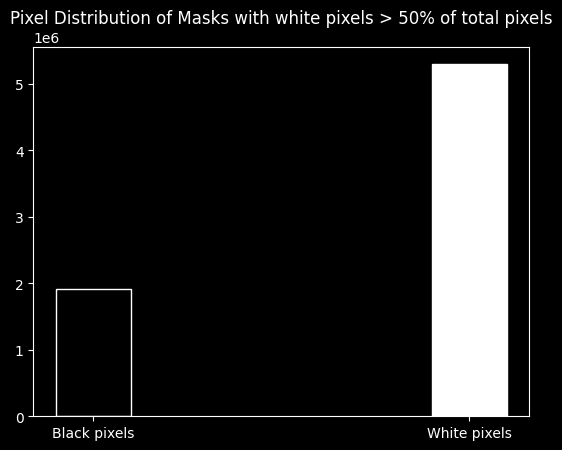

In [ ]:
plt.bar(['Black pixels','White pixels'],[blacks,whites],width=0.2, color=['black','white'],edgecolor='white')
plt.title("Pixel Distribution of Masks with white pixels > 50% of total pixels")
plt.show()

In [ ]:
count=0
for image in blackmasks:
  count+=1
  if np.count_nonzero(image == 255) == 0:
    print(count)
  blacks+= np.count_nonzero(image == 0)
  whites+= np.count_nonzero(image == 255)

In [ ]:
print("Masks with more black\nBlack pixels:",blacks,"\nWhite pixels",whites)

Masks with more black
Black pixels: 40416686 
White pixels 10766930


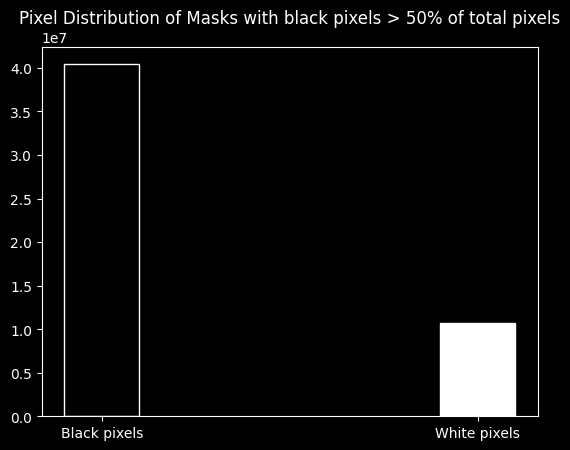

In [ ]:
plt.bar(['Black pixels','White pixels'],[blacks,whites],width=0.2, color=['black','white'],edgecolor='white')
plt.title("Pixel Distribution of Masks with black pixels > 50% of total pixels")
plt.show()

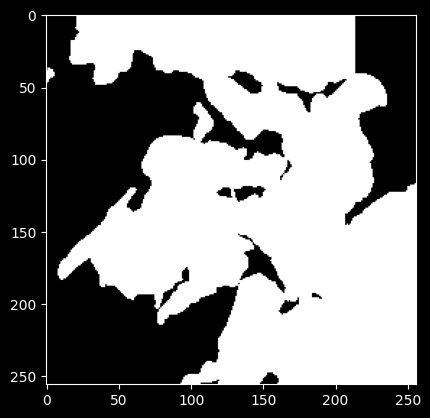

In [ ]:
plt.imshow(rio.open("/content/drive/MyDrive/Tiles/Whites/Masks/"+os.listdir("/content/drive/MyDrive/Tiles/Whites/Masks/")[0]).read(1),cmap='gray')
plt.show()

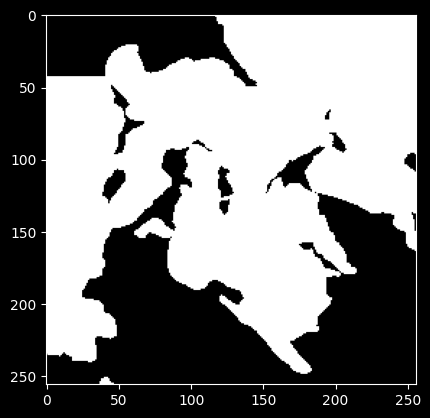

In [ ]:
plt.imshow(augmentrot(rio.open("/content/drive/MyDrive/Tiles/Whites/Masks/"+os.listdir("/content/drive/MyDrive/Tiles/Whites/Masks/")[0]).read(1),90),cmap='gray')
plt.show()

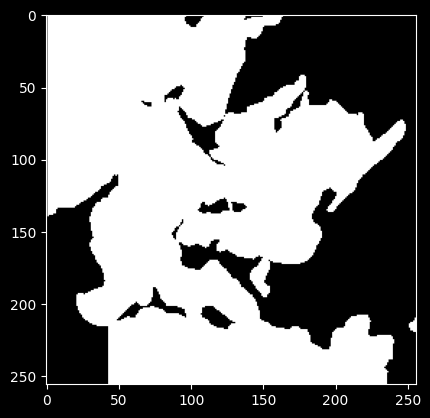

In [ ]:
plt.imshow(augmentrot(rio.open("/content/drive/MyDrive/Tiles/Whites/Masks/"+os.listdir("/content/drive/MyDrive/Tiles/Whites/Masks/")[0]).read(1),180),cmap='gray')
plt.show()

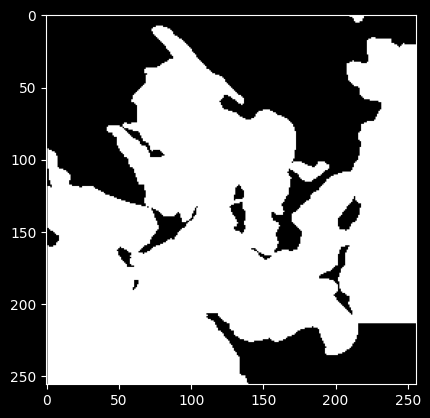

In [ ]:
plt.imshow(augmentrot(rio.open("/content/drive/MyDrive/Tiles/Whites/Masks/"+os.listdir("/content/drive/MyDrive/Tiles/Whites/Masks/")[0]).read(1),270),cmap='gray')
plt.show()

In [ ]:
tilecount = 300

In [ ]:
raspath = "/content/drive/MyDrive/AugmentedTiles/Rasters/"
maspath = "/content/drive/MyDrive/AugmentedTiles/Masks/"

for roti,rotm in zip(os.listdir("/content/drive/MyDrive/Tiles/Whites/Rasters/"),os.listdir("/content/drive/MyDrive/Tiles/Whites/Masks/")):

  rotimg = rio.open("/content/drive/MyDrive/Tiles/Whites/Rasters/"+roti)
  rotmas = rio.open("/content/drive/MyDrive/Tiles/Whites/Masks/"+rotm)

  for i in [90,180,270]:
      tilecount+=1
      transform = rotimg.transform
      rotation = Affine.rotation(i)
      for j in range(rotimg.count):
        rotated_image,rot_trans = rio.warp.reproject(rotimg.read(j+1), destination = rotimg.read(j+1), src_transform = transform, dst_transform=rotation, src_crs=rotimg.crs, dst_crs=rotimg.crs, resampling=Resampling.nearest)
        profile = rotimg.profile
        profile.update({
          'height': 256,
          'width': 256,
          'driver' : 'GTiff',
          'transform': rot_trans})
        with rio.open(raspath+str(tilecount)+".tif", 'w', **profile) as dst:
          dst.write_band(j+1,rotated_image)
      transform = rotmas.transform
      profile = rotmas.profile
      profile.update({
        'height': 256,
        'width': 256,
        'driver' : 'GTiff',
        'transform': transform,
        'count': rotmas.count})
      with rio.open(maspath+str(tilecount)+".tif", 'w', **profile) as dst:
        grayarr = cv2.threshold(augmentrot(rotmas.read(1),i), 128, 255, cv2.THRESH_BINARY)[1]
        dst.write(grayarr,indexes=1)

/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(
/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(
/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(
/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:314: NotGeoreferenced

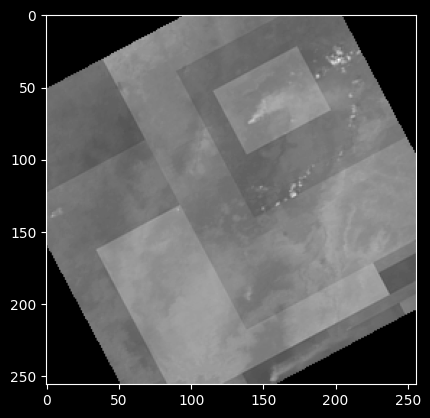

In [ ]:
plt.imshow(np.load("/content/drive/MyDrive/augmentation/"+os.listdir("/content/drive/MyDrive/augmentation")[0])[:,:,0],cmap='gray')

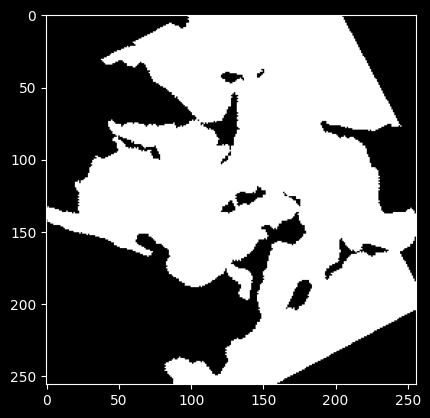

In [ ]:
plt.imshow(np.load("/content/drive/MyDrive/augmentation/"+os.listdir("/content/drive/MyDrive/augmentation")[1])[:,:],cmap='gray')